##  Wrangling and Analyzing  Data

### 1.Gathering all three datasets 

###### . First Dataset 

In [1]:
# importing hand given files into pandas dataframe
import pandas as pd
df1=pd.read_csv("twitter-archive-enhanced.CSV")

###### .Second dataset 

In [2]:
# Gathered this file by downloading it programmatically
# you need requests library
import requests

# got the url
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(url)

# wrote content of url to a file
file_name = 'Image.html'
with open(file_name, mode='wb') as file:
    file.write(response.content)
# parsing it into a dataframe 
df2 = pd.read_csv('Image.html', sep='\t')

###### .Third dataset

In [ ]:
import tweepy
from tweepy import OAuthHandler
import json
from timeit import default_timer as timer

# Query Twitter API for each tweet in the Twitter archive and save JSON in a text file
# These are hidden to comply with Twitter's API terms and conditions
consumer_key = 'Hidden'
consumer_secret = 'Hidden'
access_token = 'Hidden'
access_secret = 'Hidden'

auth = OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

api = tweepy.API(auth, wait_on_rate_limit=True)

# NOTE TO STUDENT WITH MOBILE VERIFICATION ISSUES:
# df_1 is a DataFrame with the twitter_archive_enhanced.csv file. You may have to
# change line 17 to match the name of your DataFrame with twitter_archive_enhanced.csv
# NOTE TO REVIEWER: this student had mobile verification issues so the following
# Twitter API code was sent to this student from a Udacity instructor
# Tweet IDs for which to gather additional data via Twitter's API
tweet_ids = df1.tweet_id.values
len(tweet_ids)

# Query Twitter's API for JSON data for each tweet ID in the Twitter archive
count = 0
fails_dict = {}
start = timer()
# Save each tweet's returned JSON as a new line in a .txt file
with open('tweet_json.txt', 'w') as outfile:
    # This loop will likely take 20-30 minutes to run because of Twitter's rate limit
    for tweet_id in tweet_ids:
        count += 1
        print(str(count) + ": " + str(tweet_id))
        try:
            tweet = api.get_status(tweet_id, tweet_mode='extended')
            print("Success")
            json.dump(tweet._json, outfile)
            outfile.write('\n')
        except tweepy.TweepyException as e:
            print("Fail")
            fails_dict[tweet_id] = e
            pass
end = timer()
print(end - start)
print(fails_dict)

In [3]:
# parsing it into a pandas dataframe 
df3=pd.read_json('tweet_json',lines=True)

### 2.Assessing Data

##### First dataset

In [4]:
# A full display of the rows
pd.set_option("display.max_rows", None)
df1

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Meet Jax. He enjoys ice cream so much he gets ...,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",13,10,Jax,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890729181...,13,10,None,None,None,None,None
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Zoey. She doesn't want to be one of th...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185...,13,10,Zoey,None,None,None,None
9,890240255349198849,NaN,NaN,2017-07-26 15:59:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Cassie. She is a college pup. Studying...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890240255...,14,10,Cassie,doggo,None,None,None


In [5]:
df1.shape

(2356, 17)

In [6]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [7]:
df1.isnull().sum()

tweet_id                         0
in_reply_to_status_id         2278
in_reply_to_user_id           2278
timestamp                        0
source                           0
text                             0
retweeted_status_id           2175
retweeted_status_user_id      2175
retweeted_status_timestamp    2175
expanded_urls                   59
rating_numerator                 0
rating_denominator               0
name                             0
doggo                            0
floofer                          0
pupper                           0
puppo                            0
dtype: int64

In [8]:
#Checking for values that are not equal to 10 in the rating_denominator column 
for i in df1['rating_denominator']:
    if i != 10 :
        print(i)
else:
        print('None')

0
15
70
7
11
150
11
170
20
50
90
80
50
50
40
20
130
110
11
16
120
80
2
None


##### Second dataset

In [9]:
# A full display of the rows
pd.set_option("display.max_rows", None)
df2

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,1.566650e-01,True,Shetland_sheepdog,6.142850e-02,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,7.419170e-02,True,Rhodesian_ridgeback,7.201000e-02,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,1.385840e-01,True,bloodhound,1.161970e-01,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,3.606870e-01,True,miniature_pinscher,2.227520e-01,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,2.436820e-01,True,Doberman,1.546290e-01,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,2.637880e-01,True,Greater_Swiss_Mountain_dog,1.619920e-02,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,4.588540e-02,False,terrapin,1.788530e-02,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,5.827940e-02,True,fur_coat,5.444860e-02,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,1.459380e-02,False,golden_retriever,7.958960e-03,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,1.923050e-01,True,soft-coated_wheaten_terrier,8.208610e-02,True


In [10]:
df2.shape

(2075, 12)

In [11]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [12]:
df2.isnull().sum()

tweet_id    0
jpg_url     0
img_num     0
p1          0
p1_conf     0
p1_dog      0
p2          0
p2_conf     0
p2_dog      0
p3          0
p3_conf     0
p3_dog      0
dtype: int64

In [13]:
# Checking if a prediction is greater than 1 in the p1_conf predictions 
for i in df2['p1_conf']:
    if i >1:
        print(i)
else:
        print('None')

None


In [14]:
# Checking if a prediction is greater than 1 in the p2_conf predictions 
for i in df2['p2_conf']:
    if i >1:
        print(i)
else:
        print('None')

None


In [15]:
# Checking if a prediction is greater than 1 in the p3_conf predictions 
for i in df2['p3_conf']:
    if i > 1:
        print(i)
else:
        print('None')

None


##### Third dataset

In [16]:
# A full display of the rows
pd.set_option("display.max_rows", None)
df3

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,...,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,2017-08-01 16:23:56+00:00,892420643555336193,892420643555336192,This is Phineas. He's a mystical boy. Only eve...,False,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892420639486877696, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,39467,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
1,2017-08-01 00:17:27+00:00,892177421306343426,892177421306343424,This is Tilly. She's just checking pup on you....,False,"[0, 138]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892177413194625024, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,33819,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
2,2017-07-31 00:18:03+00:00,891815181378084864,891815181378084864,This is Archie. He is a rare Norwegian Pouncin...,False,"[0, 121]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891815175371796480, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,25461,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
3,2017-07-30 15:58:51+00:00,891689557279858688,891689557279858688,This is Darla. She commenced a snooze mid meal...,False,"[0, 79]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891689552724799489, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,42908,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
4,2017-07-29 16:00:24+00:00,891327558926688256,891327558926688256,This is Franklin. He would like you to stop ca...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891327551943041024, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,41048,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
5,2017-07-29 00:08:17+00:00,891087950875897856,891087950875897856,Here we have a majestic great white breaching ...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891087942176911360, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,20562,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
6,2017-07-28 16:27:12+00:00,890971913173991426,890971913173991424,Meet Jax. He enjoys ice cream so much he gets ...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 890971906207338496, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,12041,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
7,2017-07-28 00:22:40+00:00,890729181411237888,890729181411237888,When you watch your owner call another dog a g...,False,"[0, 118]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 890729118844600320, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,56848,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
8,2017-07-27 16:25:51+00:00,890609185150312448,890609185150312448,This is Zoey. She doesn't want to be one of th...,False,"[0, 122]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 890609177319665665, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,28226,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
9,2017-07-26 15:59:51+00:00,890240255349198849,890240255349198848,This is Cassie. She is a college pup. Studying...,False,"[0, 133]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 890240245463175168, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,32467,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN


In [17]:
# A full display of the columns
pd.set_option("display.max_columns", None)
df3

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,2017-08-01 16:23:56+00:00,892420643555336193,892420643555336192,This is Phineas. He's a mystical boy. Only eve...,False,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892420639486877696, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,8853,39467,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
1,2017-08-01 00:17:27+00:00,892177421306343426,892177421306343424,This is Tilly. She's just checking pup on you....,False,"[0, 138]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892177413194625024, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,6514,33819,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
2,2017-07-31 00:18:03+00:00,891815181378084864,891815181378084864,This is Archie. He is a rare Norwegian Pouncin...,False,"[0, 121]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891815175371796480, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,4328,25461,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
3,2017-07-30 15:58:51+00:00,891689557279858688,891689557279858688,This is Darla. She commenced a snooze mid meal...,False,"[0, 79]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891689552724799489, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,8964,42908,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
4,2017-07-29 16:00:24+00:00,891327558926688256,891327558926688256,This is Franklin. He would like you to stop ca...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891327551943041024, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,9774,41048,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
5,2017-07-29 00:08:17+00:00,891087950875897856,891087950875897856,Here we have a majestic great white breaching ...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891087942176911360, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,3261,20562,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
6,2017-07-28 16:27:12+00:00,890971913173991426,890971913173991424,Meet Jax. He enjoys ice cream so much he gets ...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 890971906207338496, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,2158,12041,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
7,2017-07-28 00:22:40+00:00,890729181411237888,890729181411237888,When you watch your owner call another dog a g...,False,"[0, 118]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 890729118844600320, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,16716,56848,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
8,2017-07-27 16:25:51+00:00,890609185150312448,890609185150312448,

In [18]:
df3.shape

(2354, 31)

In [19]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2354 non-null   datetime64[ns, UTC]
 1   id                             2354 non-null   int64              
 2   id_str                         2354 non-null   int64              
 3   full_text                      2354 non-null   object             
 4   truncated                      2354 non-null   bool               
 5   display_text_range             2354 non-null   object             
 6   entities                       2354 non-null   object             
 7   extended_entities              2073 non-null   object             
 8   source                         2354 non-null   object             
 9   in_reply_to_status_id          78 non-null     float64            
 10  in_reply_to_status_id_st

In [20]:
df3.isnull().sum()

created_at                          0
id                                  0
id_str                              0
full_text                           0
truncated                           0
display_text_range                  0
entities                            0
extended_entities                 281
source                              0
in_reply_to_status_id            2276
in_reply_to_status_id_str        2276
in_reply_to_user_id              2276
in_reply_to_user_id_str          2276
in_reply_to_screen_name          2276
user                                0
geo                              2354
coordinates                      2354
place                            2353
contributors                     2354
is_quote_status                     0
retweet_count                       0
favorite_count                      0
favorited                           0
retweeted                           0
possibly_sensitive                143
possibly_sensitive_appealable     143
lang        

### Quality issues
1.(df1) In the 'name' column , values that are all lowercase are not dog names.-Visually assessed

2.(df1)in_reply_to_status_id column contain a lot of  missing values-Programmatically assessed 

3.(df1)retweeted_status_id column contain a lot of  missing values-Programmatically assessed 

4.(df1) Columns such as  'retweeted_status_id, retweeted_status_user _id, and retweeted_status _timestamp values are that of      retweets and won't be used for our analysis- Visually assessed

5.(df1 ) Missing values in expanded_urls column- Programmatically assessed

6.(df1)  Presence of numbers which aren't equals to 10 present in the rating_denominator column-Programmatically assessed 

7.(df1) in_reply_to_user_id column contain a lot of  missing values-Programmatically assessed 

8.(df1) retweeted_status_timestamp column contain a lot of  missing values-Programmatically assessed 

9.(df1)  retweeted_status_user_id column contain a lot of of missing values -Programmatically assessed 



### Tidiness issues¶
1.(df1)doggo, floofer, pupper, puppo) are categories of dog 'stage' and need to be one column.-Visually assessed 

2.(df3) Renaming id  column to "tweet_id" to enable merging-Visually assessed

3.(df1) timestamp column is not in datetime data type - Programmatically assessed

### 3.Data cleaning 

In [21]:
# Making a copy of each dataset to preserve the original dataset ,the cleaning will take place in the copy . 
df1_clean=df1.copy()
df2_clean=df2.copy()
df3_clean=df3.copy()

##### Cleaning each dataset individually before creating the general dataframe for our analysis.
#### df1.clean


##### .Define

> Changing numbers which are not equal to '10' in the denominator to '10'

#### .Code

In [22]:
# Creating  a list to contain all the numbers  that are not 10
integers = []

for  c in df1_clean.rating_denominator:
    if c !=10 and c not in integers:
        integers.append(c)
    
print(integers)

[0, 15, 70, 7, 11, 150, 170, 20, 50, 90, 80, 40, 130, 110, 16, 120, 2]


In [23]:
# Replace numbers that aren't 10 to 10 
df1_clean["rating_denominator"].replace(integers, 10, inplace=True)

#### .Test

In [24]:
#Checking for values that are not equal to 10 in the rating_denominator column 
for i in df1_clean['rating_denominator']:
    if i != 10 :
        print(i)
else:
        print('None')

None


In [25]:
df1_clean['rating_denominator'].value_counts()

10    2356
Name: rating_denominator, dtype: int64

##### .Define

> Changing values in the "name" colum that are neither a Name nor None to None 

##### .Code

In [26]:
# Creating a list to contain all the names that starts with lowercase
low = []

for a in df1_clean.name:
    if a.islower() and a not in low:
        low.append(a)
    
print(low)

['such', 'a', 'quite', 'not', 'one', 'incredibly', 'mad', 'an', 'very', 'just', 'my', 'his', 'actually', 'getting', 'this', 'unacceptable', 'all', 'old', 'infuriating', 'the', 'by', 'officially', 'life', 'light', 'space']


In [27]:
# Replace the  lower case satrting names  with the word "None
df1_clean["name"].replace(low, "None", inplace=True)

##### .Test

In [28]:
for  d in df1_clean.name:
    if d .islower():
        print(d)
else:
    print("Nothing")

Nothing


##### .Define

> Missing values - Columns such as in_reply_to_status_id  ,in_reply_to_user_id  , retweeted_status_id , retweeted_status_user_id and retweeted_status_timestamp  have a lot of missing values and are also not going to be useful for any future analysis hence it will be dropped .


> Missing values -  in the column expanded_urls  I am going to choose to fill the the missing value .         

#### Code

In [29]:
# Dropping  in_reply_to_status_id ,in_reply_to_user_id , retweeted_status_id , retweeted_status_user_id and retweeted_status_timestamp 
df1_clean.drop(['in_reply_to_status_id','in_reply_to_user_id'],axis=1,inplace=True)
df1_clean.drop(['retweeted_status_id' , 'retweeted_status_user_id' ,'retweeted_status_timestamp'],axis=1,inplace=True)

In [30]:
# Filling expanded_urls
df1_clean['expanded_urls'].fillna(df1_clean['expanded_urls'].mode()[0],inplace=True)

##### .Test

In [31]:
df1_clean.columns

Index(['tweet_id', 'timestamp', 'source', 'text', 'expanded_urls',
       'rating_numerator', 'rating_denominator', 'name', 'doggo', 'floofer',
       'pupper', 'puppo'],
      dtype='object')

In [32]:
df1_clean.isnull().sum()

tweet_id              0
timestamp             0
source                0
text                  0
expanded_urls         0
rating_numerator      0
rating_denominator    0
name                  0
doggo                 0
floofer               0
pupper                0
puppo                 0
dtype: int64

### .Tidiness 

#### .Define

> Changing timestamp column from object to datetime

###### Code

In [33]:
df1_clean['timestamp'] = pd.to_datetime(df1_clean['timestamp'])


#### .Test

In [34]:
df1_clean['timestamp'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2356 entries, 0 to 2355
Series name: timestamp
Non-Null Count  Dtype              
--------------  -----              
2356 non-null   datetime64[ns, UTC]
dtypes: datetime64[ns, UTC](1)
memory usage: 18.5 KB


#### .Define 

> 4 columns (doggo, floofer, pupper, puppo) are categories of a dog's stage and need to be in one column 'stage'.

#### .Code

In [35]:
# First replace None in dog.stage columns with empty string 
df1_clean.doggo.replace('None', '', inplace=True)
df1_clean.floofer.replace('None', '', inplace=True)
df1_clean.pupper.replace('None', '', inplace=True)
df1_clean.puppo.replace('None', '', inplace=True)

#  combine columns to form  stage columns
df1_clean['dog.stage'] = df1_clean.doggo + df1_clean.floofer + df1_clean.pupper + df1_clean.puppo


# Then format entries with multiple dog stages which appeared like doggo,pupper
df1_clean.loc[df1_clean['dog.stage'] == 'doggopupper', 'dog.stage'] = 'doggo,pupper'
df1_clean.loc[df1_clean['dog.stage'] == 'doggopuppo', 'dog.stage'] = 'doggo,puppo'
df1_clean.loc[df1_clean['dog.stage'] == 'doggofloofer', 'dog.stage'] = 'doggo,floofer'

In [36]:
# Dropping  old columns
df1_clean.drop(['doggo', 'floofer', 'pupper', 'puppo'], axis=1, inplace=True)

#  Using np.nan to fill the empty spaces
import numpy as np
df1_clean['dog.stage'] = df1_clean['dog.stage'].replace('', np.nan)

#### .Test

In [37]:
df1_clean.head(5)

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,dog.stage
0,892420643555336193,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,NaN
1,892177421306343426,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,NaN
2,891815181378084864,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,NaN
3,891689557279858688,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,NaN
4,891327558926688256,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,NaN


In [38]:
df1_clean['dog.stage'].value_counts()

pupper           245
doggo             83
puppo             29
doggo,pupper      12
floofer            9
doggo,puppo        1
doggo,floofer      1
Name: dog.stage, dtype: int64

In [39]:
df1_clean.columns

Index(['tweet_id', 'timestamp', 'source', 'text', 'expanded_urls',
       'rating_numerator', 'rating_denominator', 'name', 'dog.stage'],
      dtype='object')

#### Data Cleaning 
###### .df3

##### .Define
>   Dropping mIssing values in df3

#### .Code

In [40]:
df3_clean.drop(['extended_entities', 'in_reply_to_status_id'], axis=1, inplace=True)
df3_clean.drop(['in_reply_to_status_id_str', 'in_reply_to_user_id'], axis=1, inplace=True)
df3_clean.drop(['in_reply_to_user_id_str', 'in_reply_to_screen_name'], axis=1, inplace=True)
df3_clean.drop(['geo', 'coordinates'], axis=1, inplace=True)
df3_clean.drop(['place', 'contributors'], axis=1, inplace=True)
df3_clean.drop(['retweeted_status', 'quoted_status_id'], axis=1, inplace=True)
df3_clean.drop(['quoted_status_id_str', 'quoted_status'], axis=1, inplace=True)
df3_clean.drop(['possibly_sensitive', 'possibly_sensitive_appealable'], axis=1, inplace=True)

#### .Test

In [41]:
df3_clean.isnull().sum()

created_at            0
id                    0
id_str                0
full_text             0
truncated             0
display_text_range    0
entities              0
source                0
user                  0
is_quote_status       0
retweet_count         0
favorite_count        0
favorited             0
retweeted             0
lang                  0
dtype: int64

### .Tidiness
##### .Define

> renaming id column to 'tweet_id' to enable merging

In [42]:
# Renaming both columns
df3_clean.rename(columns = {'id':'tweet_id'},inplace=True)

#### .Test

In [43]:
df3_clean.columns

Index(['created_at', 'tweet_id', 'id_str', 'full_text', 'truncated',
       'display_text_range', 'entities', 'source', 'user', 'is_quote_status',
       'retweet_count', 'favorite_count', 'favorited', 'retweeted', 'lang'],
      dtype='object')

#### 3.Merging , creating and storing a  new  dataset 

In [58]:
new_1=df1_clean[['tweet_id','name','rating_numerator',"dog.stage"]]
new_1.head(5)

,tweet_id,name,rating_numerator,dog.stage
0,892420643555336193,Phineas,13,NaN
1,892177421306343426,Tilly,13,NaN
2,891815181378084864,Archie,12,NaN
3,891689557279858688,Darla,13,NaN
4,891327558926688256,Franklin,12,NaN


In [59]:
# Second dataset 
new_2=df2_clean[['tweet_id','jpg_url','img_num',"p1",'p1_conf','p1_dog','p2','p2_conf','p2_dog','p3','p3_dog','p3_conf']]
new_2.head(5)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_dog,p3_conf
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,True,0.061428
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,True,0.072010
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,True,0.116197
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,True,0.222752
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,True,0.154629


In [60]:
# Third dataset 
new_3=df3_clean[['tweet_id','favorite_count','retweet_count']]
new_3.head(5)

,tweet_id,favorite_count,retweet_count
0,892420643555336193,39467,8853
1,892177421306343426,33819,6514
2,891815181378084864,25461,4328
3,891689557279858688,42908,8964
4,891327558926688256,41048,9774


In [61]:
# Merging new_1 and new_2 first
inner = pd.merge(new_1,new_2)
#Merging new_3
data=pd.merge(inner,new_3)
data.head(5)

,tweet_id,name,rating_numerator,dog.stage,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_dog,p3_conf,favorite_count,retweet_count
0,892420643555336193,Phineas,13,NaN,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,0.085851,False,banana,False,0.076110,39467,8853
1,892177421306343426,Tilly,13,NaN,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,True,0.068957,33819,6514
2,891815181378084864,Archie,12,NaN,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,True,0.031379,25461,4328
3,891689557279858688,Darla,13,NaN,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,False,0.040836,42908,8964
4,891327558926688256,Franklin,12,NaN,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,True,0.175219,41048,9774


In [62]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2073 entries, 0 to 2072
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   tweet_id          2073 non-null   int64  
 1   name              2073 non-null   object 
 2   rating_numerator  2073 non-null   int64  
 3   dog.stage         320 non-null    object 
 4   jpg_url           2073 non-null   object 
 5   img_num           2073 non-null   int64  
 6   p1                2073 non-null   object 
 7   p1_conf           2073 non-null   float64
 8   p1_dog            2073 non-null   bool   
 9   p2                2073 non-null   object 
 10  p2_conf           2073 non-null   float64
 11  p2_dog            2073 non-null   bool   
 12  p3                2073 non-null   object 
 13  p3_dog            2073 non-null   bool   
 14  p3_conf           2073 non-null   float64
 15  favorite_count    2073 non-null   int64  
 16  retweet_count     2073 non-null   int64  


In [63]:
data.shape

(2073, 17)

#### .Storing 

In [64]:
#Saving to csv file
data.to_csv("twitter_archive_master.csv", index=False)
#Reading master dataset
data = pd.read_csv("twitter_archive_master.csv")

In [65]:
data.head(3)

,tweet_id,name,rating_numerator,dog.stage,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_dog,p3_conf,favorite_count,retweet_count
0,892420643555336193,Phineas,13,NaN,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,0.085851,False,banana,False,0.076110,39467,8853
1,892177421306343426,Tilly,13,NaN,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,True,0.068957,33819,6514
2,891815181378084864,Archie,12,NaN,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,True,0.031379,25461,4328


## Data Visualisation and Invesigation

### < Exploratory Data Analysis

In [66]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
tweet_id,2073.0,7.383634e+17,6.780118e+16,6.660209e+17,6.764706e+17,7.119681e+17,7.931959e+17,8.924206e+17
rating_numerator,2073.0,1.226580e+01,4.069992e+01,0.000000e+00,1.000000e+01,1.100000e+01,1.200000e+01,1.776000e+03
img_num,2073.0,1.203570e+00,5.618561e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,4.000000e+00
p1_conf,2073.0,5.945317e-01,2.712345e-01,4.433340e-02,3.640950e-01,5.882300e-01,8.439110e-01,1.000000e+00
p2_conf,2073.0,1.346665e-01,1.006830e-01,1.011300e-08,5.390140e-02,1.186220e-01,1.955730e-01,4.880140e-01
p3_conf,2073.0,6.034005e-02,5.092769e-02,1.740170e-10,1.619920e-02,4.947150e-02,9.193000e-02,2.734190e-01
favorite_count,2073.0,8.556718e+03,1.209864e+04,0.000000e+00,1.674000e+03,3.864000e+03,1.093700e+04,1.328100e+05
retweet_count,2073.0,2.976089e+03,5.054898e+03,1.600000e+01,6.340000e+02,1.408000e+03,3.443000e+03,7.951500e+04


In [69]:
data.corr()

,tweet_id,rating_numerator,img_num,p1_conf,p1_dog,p2_conf,p2_dog,p3_dog,p3_conf,favorite_count,retweet_count
tweet_id,1.000000,0.023103,0.205455,0.101283,0.111304,0.003047,0.112607,0.087844,-0.042979,0.607007,0.404702
rating_numerator,0.023103,1.000000,-0.000405,-0.009143,-0.028515,-0.020317,-0.033740,-0.028497,-0.003887,0.010157,0.012787
img_num,0.205455,-0.000405,1.000000,0.203071,0.026060,-0.159690,0.045653,0.059565,-0.139454,0.132241,0.105534
p1_conf,0.101283,-0.009143,0.203071,1.000000,0.118777,-0.511547,0.131969,0.109022,-0.709583,0.076077,0.044739
p1_dog,0.111304,-0.028515,0.026060,0.118777,1.000000,0.112147,0.634661,0.555778,0.048809,0.056156,0.006092
p2_conf,0.003047,-0.020317,-0.159690,-0.511547,0.112147,1.000000,0.100462,0.067387,0.478953,-0.022787,-0.008619
p2_dog,0.112607,-0.033740,0.045653,0.131969,0.634661,0.100462,1.000000,0.550166,0.042869,0.060114,0.017197
p3_dog,0.087844,-0.028497,0.059565,0.109022,0.555778,0.067387,0.550166,1.000000,0.041768,0.043928,0.006140
p3_conf,-0.042979,-0.003887,-0.139454,-0.709583,0.048809,0.478953,0.042869,0.041768,1.000000,-0.053427,-0.035511
favorite_count,0.607007,0.010157,0.132241,0.076077,0.056156,-0.022787,0.060114,0.043928,-0.053427,1.000000,0.790476


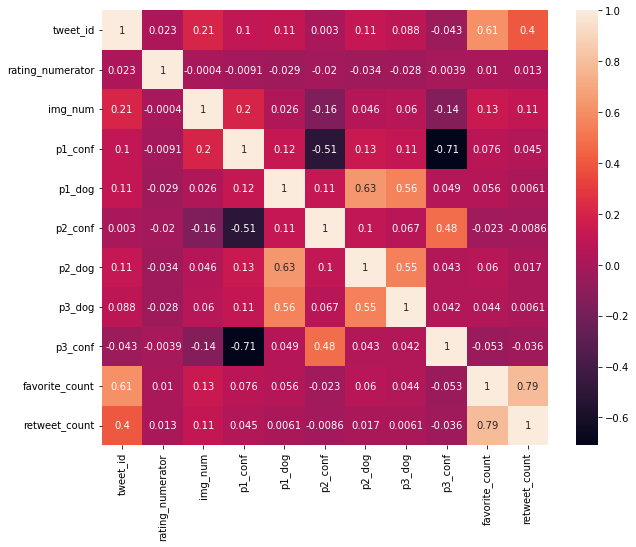

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10,8))
sns.heatmap(data.corr(), annot=True);

Based on the results above , its clear to see that we have high correlation between :

>.tweet_id and retweet_count

>.tweet_id and favorite_count 

>retweet_count and favourite_count

Text(0.5, 1.0, ' Dog stage with highest rating ')

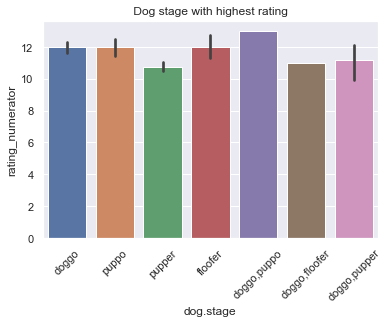

In [80]:
sns.barplot(x= "dog.stage",y='rating_numerator',data= data)
plt.xticks(rotation= 45)
plt.title(" Dog stage with highest rating ")

Text(0.5, 1.0, ' Dog stages ')

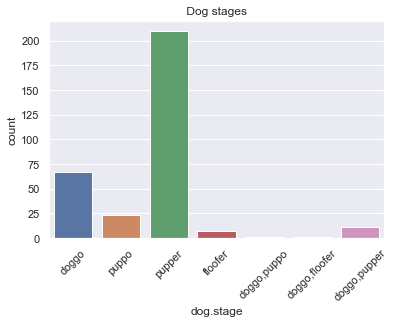

In [82]:
sns.countplot(x= "dog.stage",data= data,orient='h')
plt.xticks(rotation= 45)
plt.title(" Dog stages ")

>From the visualisation of dog stages above , it shows that 'pupper is the most popular dog stage, followed by 'doggo' and 'puppo' due to the fact that any specie  or in this case dogs are cuter at a younger stage .

>A doogo transitioning into a puppo has the highest rating .

> This analysis is based on  the data we have and not forgetting that we have missing values in the "dog.stage" column 